In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import numpy as np
import cv2
import matplotlib.image as mpimg
import pickle
import tensorflow as tf
tf.python.control_flow_ops = tf
from keras.models import Sequential
from keras.layers.core import Dense, Activation, Flatten
from keras.activations import relu, softmax
from keras.models import model_from_json
from keras.models import Sequential
from keras.layers.core import Dense, Activation, Flatten, SpatialDropout2D
from keras.layers.core import Dropout, Lambda
from keras.layers import Lambda
from keras.layers.convolutional import Convolution2D
from keras.layers.pooling import MaxPooling2D
%matplotlib inline


Using TensorFlow backend.


In [2]:
def read_images(path):
    ret = []
    images = glob.glob(path)
    for fname in images:
        img = cv2.imread(fname)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        ret.append(img)
    ret = np.array(ret)
    return ret


vehicle = read_images("vehicles/KITTI_extracted/*")
vehicle = np.concatenate((vehicle, read_images("vehicles/GTI_Far/*")), axis=0)
vehicle = np.concatenate((vehicle, read_images("vehicles/GTI_Left/*")), axis=0)
vehicle = np.concatenate((vehicle, read_images("vehicles/GTI_MiddleClose/*")), axis=0)
vehicle = np.concatenate((vehicle, read_images("vehicles/GTI_Right/*")), axis=0)
non_vehicle = read_images("non-vehicles/GTI/*")
non_vehicle = np.concatenate((non_vehicle, read_images("non-vehicles/Extras/*")), axis=0)
print(vehicle.shape)
print(non_vehicle.shape)

(8792, 64, 64, 3)
(8968, 64, 64, 3)


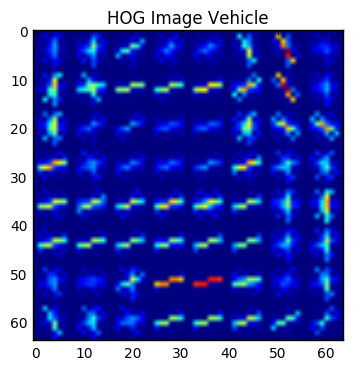

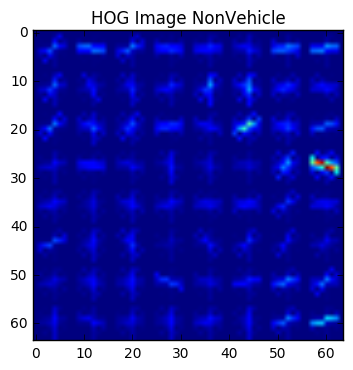

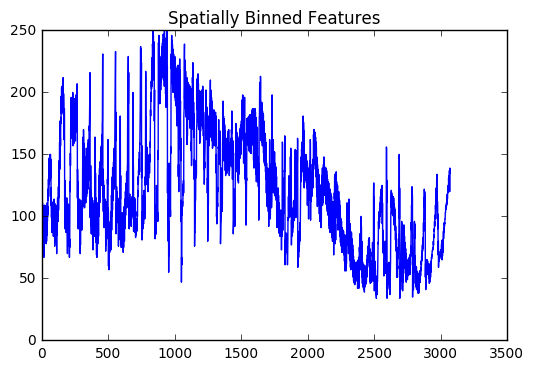

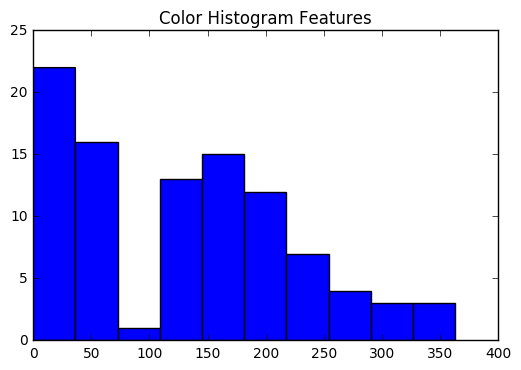

In [3]:
from skimage.feature import hog

# Define a function to return HOG features and visualization
def get_hog_features(img, orient, pix_per_cell, cell_per_block, 
                        vis=False, feature_vec=True):
    # Call with two outputs if vis==True
    if vis == True:
        features, hog_image = hog(img, orientations=orient, 
                                  pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), 
                                  transform_sqrt=True, 
                                  visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    # Otherwise call with one output
    else:      
        features = hog(img, orientations=orient, 
                       pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), 
                       transform_sqrt=True, 
                       visualise=vis, feature_vector=feature_vec)
        return features

# Define a function to compute binned color features  
def bin_spatial(img, size=(32, 32)):
    # Use cv2.resize().ravel() to create the feature vector
    features = cv2.resize(img, size).ravel() 
    # Return the feature vector
    return features

# Define a function to compute color histogram features 
# NEED TO CHANGE bins_range if reading .png files with mpimg!
def color_hist(img, nbins=32, bins_range=(0, 256)):
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins, range=bins_range)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins, range=bins_range)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins, range=bins_range)
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return hist_features

# Define a function to extract features from a list of images
# Have this function call bin_spatial() and color_hist()
def extract_feature(image, color_space='YUV', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True):

    file_features = []
    # apply color conversion if other than 'RGB'
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        
    else: feature_image = np.copy(image)      

    if spatial_feat == True:
        spatial_features = bin_spatial(feature_image, size=spatial_size)
        file_features.append(spatial_features)
    if hist_feat == True:
        # Apply color_hist()
        hist_features = color_hist(feature_image, nbins=hist_bins)
        file_features.append(hist_features)
    if hog_feat == True:
    # Call get_hog_features() with vis=False, feature_vec=True
        if hog_channel == 'ALL':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                hog_features.append(get_hog_features(feature_image[:,:,channel], 
                                    orient, pix_per_cell, cell_per_block, 
                                    vis=False, feature_vec=True))
            hog_features = np.ravel(hog_features)        
        else:
            hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                        pix_per_cell, cell_per_block, vis=False, feature_vec=True)
        # Append the new feature vector to the features list
        file_features.append(hog_features)
    # Return list of feature vectors
    file_feature = np.concatenate(file_features)
    return file_feature


from sklearn.preprocessing import StandardScaler
def scale_features(feat):
    # Fit a per-column scaler
    X_scaler = StandardScaler().fit(feat)
    # Apply the scaler to X
    scaled_X = X_scaler.transform(feat)
    return scaled_X, X_scaler

orient = 9  # HOG orientations
pix_per_cell = 8 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
test_image = "vehicles/GTI_Far/image0800.png"
feature_image = cv2.imread(test_image)
feature_image = cv2.cvtColor(feature_image, cv2.COLOR_BGR2RGB)
hog_features, hog_image = get_hog_features(feature_image[:,:,0], orient, 
                        pix_per_cell, cell_per_block, vis=True, feature_vec=True)
plt.figure(1)
plt.imshow(hog_image)
plt.title('HOG Image Vehicle')
plt.show()
cv2.imwrite('output_images/hog_vehicle.png', hog_image)

test_image = "non-vehicles/GTI/image1.png"
feature_image = cv2.imread(test_image)
feature_image = cv2.cvtColor(feature_image, cv2.COLOR_BGR2RGB)
hog_features, hog_image = get_hog_features(feature_image[:,:,0], orient, 
                        pix_per_cell, cell_per_block, vis=True, feature_vec=True)
plt.figure(2)
plt.imshow(hog_image)
plt.title('HOG Image NonVehicle')
plt.show()
cv2.imwrite('output_images/hog_non_vehicle.png', hog_image)

test_image = "vehicles/GTI_Far/image0801.png"
plt.figure(3)
feature_image = cv2.imread(test_image)
feature_image = cv2.cvtColor(feature_image, cv2.COLOR_BGR2RGB)
feature_vec = bin_spatial(feature_image)
plt.plot(feature_vec)
plt.title('Spatially Binned Features')
plt.show()

plt.figure(4)
feature_image = cv2.imread(test_image)
feature_image = cv2.cvtColor(feature_image, cv2.COLOR_BGR2RGB)
hist_features = color_hist(feature_image)
plt.hist(hist_features)
plt.title('Color Histogram Features')
plt.show()

In [4]:
test_image = "vehicles/GTI_Far/image0800.png"
image = cv2.imread(test_image)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
feat = extract_feature(image, hog_channel='ALL')

test_image1 = "vehicles/GTI_Far/image0000.png"
image1 = cv2.imread(test_image1)
image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
feat1 = extract_feature(image1, hog_channel='ALL')
print(feat[1000:1020])
print(feat1[1000:1020])

[ 116.  127.  193.  117.  127.  192.  117.  130.  190.  117.  131.  191.
  116.  130.  194.  116.  131.  192.  118.  132.]
[ 124.  132.   69.  124.  132.   63.  123.  132.   61.  123.  132.   61.
  122.  132.   58.  123.  132.   58.  124.  132.]


In [5]:
def extract_features(imgs):
    
    features = []
    for img in imgs:
        feat = extract_feature(img)
        features.append(feat)
    #print(features[0])
    #print(features[0])
    return features


vehicle_feat = extract_features(vehicle)

non_vehicle_feat = extract_features(non_vehicle)

feat = np.vstack((vehicle_feat, non_vehicle_feat)).astype(np.float64)
feat, X_scaler = scale_features(feat)

label = np.hstack((np.ones(len(vehicle_feat)), np.zeros(len(non_vehicle_feat))))

print(feat.shape)
print(label.shape)
data = {
    "feature": feat,
    "label": label
}
pickle_file = "data.p"
import pickle
pickle.dump(data, open(pickle_file, "wb"))

(17760, 4932)
(17760,)


[ 1.88170751 -4.69069888  2.50044509 ..., -0.65977985 -0.70415285
 -0.48924704]
[ 0.60519256  0.72503449 -2.21850383 ..., -0.03336777 -0.05176958
  0.61666685]
(17760, 4932)
(17760,)
2
1.0
1.0
0.0
0.0


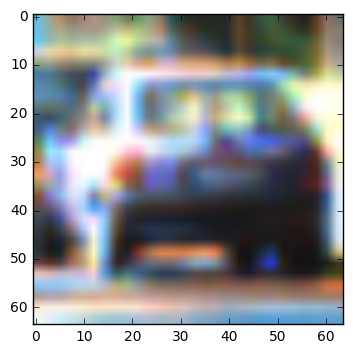

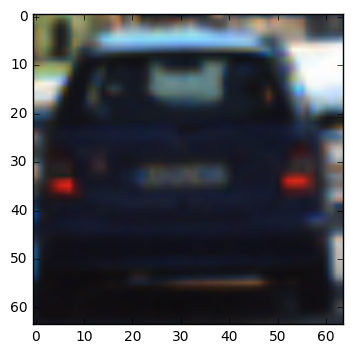

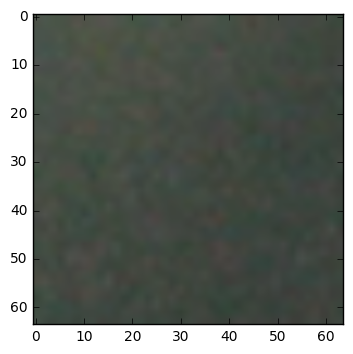

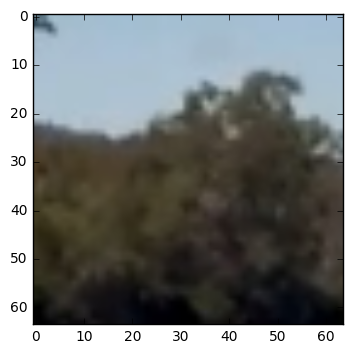

In [6]:
with open(pickle_file, mode='rb') as f:
    data = pickle.load(f)

X_train, y_train = data['feature'], data['label']
print(X_train[0])
print(X_train[1])
print(X_train.shape)
print(y_train.shape)
print(len(np.unique(y_train)))
nb_classes = len(np.unique(y_train))

for i in range(0, 2):
    plt.figure(i)
    print(y_train[i])
    plt.imshow(vehicle[i])

for i in range(len(vehicle), len(vehicle) + 2):
    plt.figure(i)
    print(y_train[i])
    plt.imshow(non_vehicle[len(vehicle) - i])

In [7]:
from sklearn.cross_validation import train_test_split

rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size=0.2, random_state=rand_state)
imgshape = X_train.shape
print(imgshape)
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)
print(X_train[0])

(14208, 4932)
(14208, 4932)
(14208,)
(3552, 4932)
(3552,)
[-1.03090406  0.13636782 -0.09497682 ..., -0.56744448 -0.59775002
 -0.48924704]


/home/pratyushverma/installation/anaconda2/envs/carnd-term1/lib/python3.5/site-packages/sklearn/cross_validation.py:44: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


In [8]:
from sklearn.svm import LinearSVC
print(X_train.shape)
print(y_train.shape)
svc = LinearSVC()
svc.fit(X_train, y_train)
p = svc.score(X_test, y_test)
print(p)


(14208, 4932)
(14208,)
0.98704954955


[ 1.]
[ 0.]
[ 0.]
[ 1.]
[ 0.]


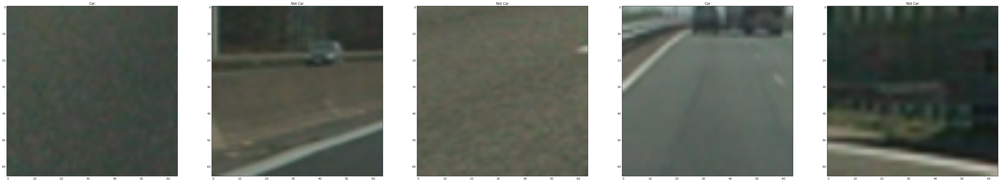

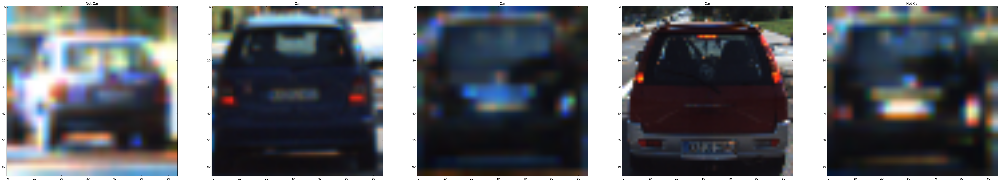

In [9]:
f, x = plt.subplots(1, 5, figsize=(64, 64))
x = x.ravel()

for i in range(0, 5):
    test_feat = extract_features([non_vehicle[i]])
    p = svc.predict(test_feat)
    print(p)
    if p == 1:
        x[i].imshow(non_vehicle[i])
        x[i].set_title('Car')
    else:
        x[i].imshow(non_vehicle[i])
        x[i].set_title('Not Car')

plt.figure(1)
f, x = plt.subplots(1, 5, figsize=(64, 64))
for i in range(0, 5):
    test_feat = extract_features([vehicle[i]])
    p = svc.predict(test_feat)
    if p == 1:
        x[i].imshow(vehicle[i])
        x[i].set_title('Car')
    else:
        x[i].imshow(vehicle[i])
        x[i].set_title('Not Car')

2 cars found


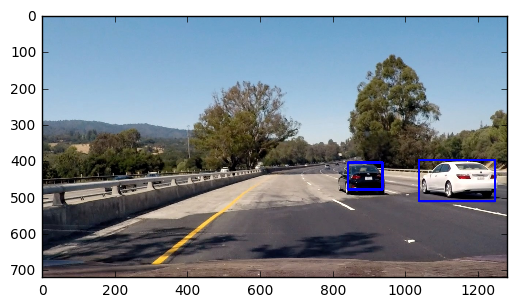

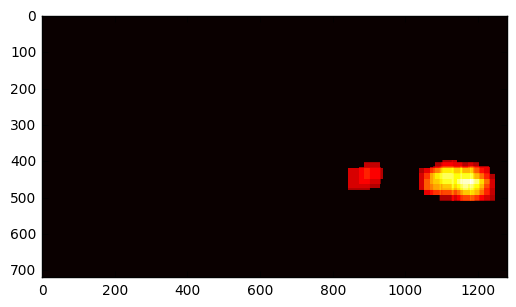

In [10]:

def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], 
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
    # Compute the span of the region to be searched    
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    # Compute the number of windows in x/y
    nx_buffer = np.int(xy_window[0]*(xy_overlap[0]))
    ny_buffer = np.int(xy_window[1]*(xy_overlap[1]))
    nx_windows = np.int((xspan-nx_buffer)/nx_pix_per_step) 
    ny_windows = np.int((yspan-ny_buffer)/ny_pix_per_step) 
    # Initialize a list to append window positions to
    window_list = []
    # Loop through finding x and y window positions
    # Note: you could vectorize this step, but in practice
    # you'll be considering windows one by one with your
    # classifier, so looping makes sense
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate window position
            startx = xs*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
#             if endx - startx > 64:
#                 print("EXCEED")
#                 print(xs)
#                 print(ys)
                
            # Append window position to list
            window_list.append(((startx, starty), (endx, endy)))
    # Return the list of windows
    return window_list

def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap# Iterate through list of bboxes
    
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

from scipy.ndimage.measurements import label
prev_window = []
def process_image(image):
    image_xy = image.shape
    original_image = image
    deleted_h = 0#int(image_xy[0]/2)
    deleted_w = 0#int(image_xy[1]/3)
    global prev_window
    
    heat = np.zeros_like(original_image[:,:,0]).astype(np.float)
    crop_sizes = [ [60, 60], [96, 96], [128, 96]]
    image_xy = img.shape
    half = int(image_xy[0]/2)
    third = int(image_xy[0]/3)
    quarter = int(image_xy[0]/4)
    full = int(image_xy[0])
    y_start_stop_scale = [(half, full), (half, full), (half, full)]
    overlap_scale = [(0.75, 0.75), (0.7, 0.7), (0.8, 0.8)]
    
    idx = 0
    for crop_size in crop_sizes:
        windows = slide_window(image, x_start_stop=[None, None], y_start_stop=y_start_stop_scale[idx], 
                           xy_window=(crop_size[0], crop_size[1]), xy_overlap=overlap_scale[idx])
        cars = []
        idx = idx + 1
        for window in windows:
            cropped_image = cv2.resize(image[window[0][1]:window[1][1], window[0][0]:window[1][0]], (64, 64))

            feat = extract_features([cropped_image])
            feat = X_scaler.transform(feat)
            is_car = svc.predict(feat)
            if is_car == 1:
                window = [(window[0][0] + deleted_w, window[0][1]+ deleted_h), (window[1][0]+ deleted_w, window[1][1]+ deleted_h)]
                cars.append(window)
                prev_window.append(window)
    #             if len(cars) == 5:
    #                 break

        heat = add_heat(heat, prev_window)
        prev_window = cars
        
    heat = apply_threshold(heat, 8)
    heatmap = np.clip(heat, 0, 255)
    labels = label(heatmap)
    
    print(labels[1], 'cars found')
    draw_img = draw_labeled_bboxes(np.copy(original_image), labels)
#     plt.figure(2)
#     plt.imshow(heatmap, cmap='hot')
    plt.figure(3)
#     plt.imshow(draw_img)
    return cars, draw_img, heatmap

def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        if abs(bbox[0][0] - bbox[1][0]) < 55:
            continue
        elif abs(bbox[0][1] - bbox[1][1]) < 55:
            continue
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    # Return the image
    return img

def draw_box(img, bboxes, color=(0, 0, 255), thick=6):
    # Make a copy of the image
    imcopy = np.copy(img)
    # Iterate through the bounding boxes
    for bbox in bboxes:
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return imcopy


def process_frame(img):
    window, frame, heatmap = process_image(img)
#     window_img = draw_box(img, window, color=(0, 0, 255), thick=6)
    return frame, heatmap

def wrapper_func(img):
    frame, heat = process_frame(img)
    return frame

img = cv2.imread("test_images/test4.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
x, heatmap = process_frame(img)
plt.figure(1)
plt.imshow(x, cmap="hot")
plt.figure(2)
plt.imshow(heatmap, cmap="hot")

[(360, 540), (360, 720), (360, 720)]


True

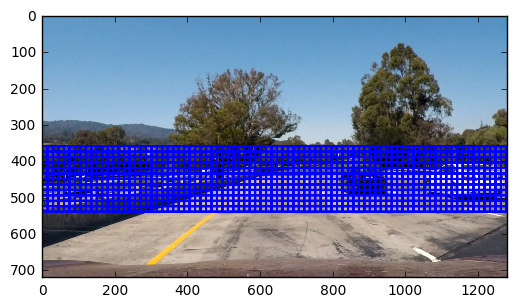

In [11]:
img = cv2.imread("test_images/test1.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
crop_sizes = [ [60, 60], [96, 96], [128, 96]]
image_xy = img.shape
half = int(image_xy[0]/2)
third = int(image_xy[0]/3)
quarter = int(image_xy[0]/4)
full = int(image_xy[0])
y_start_stop_scale = [(half, 3 * quarter), (half, full), (half, full)]
overlap_scale = [(0.75, 0.75), (0.7, 0.7), (0.8, 0.8)]

print(y_start_stop_scale)
idx = 0
for crop_size in crop_sizes:
    
    windows = slide_window(img, x_start_stop=[None, None], y_start_stop=(y_start_stop_scale[idx]), 
                       xy_window=(crop_sizes[idx][0], crop_sizes[idx][1]), xy_overlap=overlap_scale[idx])
    idx = idx + 1
    img = draw_box(img, windows)
    break
plt.figure(2)
plt.imshow(img)
cv2.imwrite("output_images/grid_example.png", img)

2 cars found
3 cars found
2 cars found
2 cars found
1 cars found
3 cars found


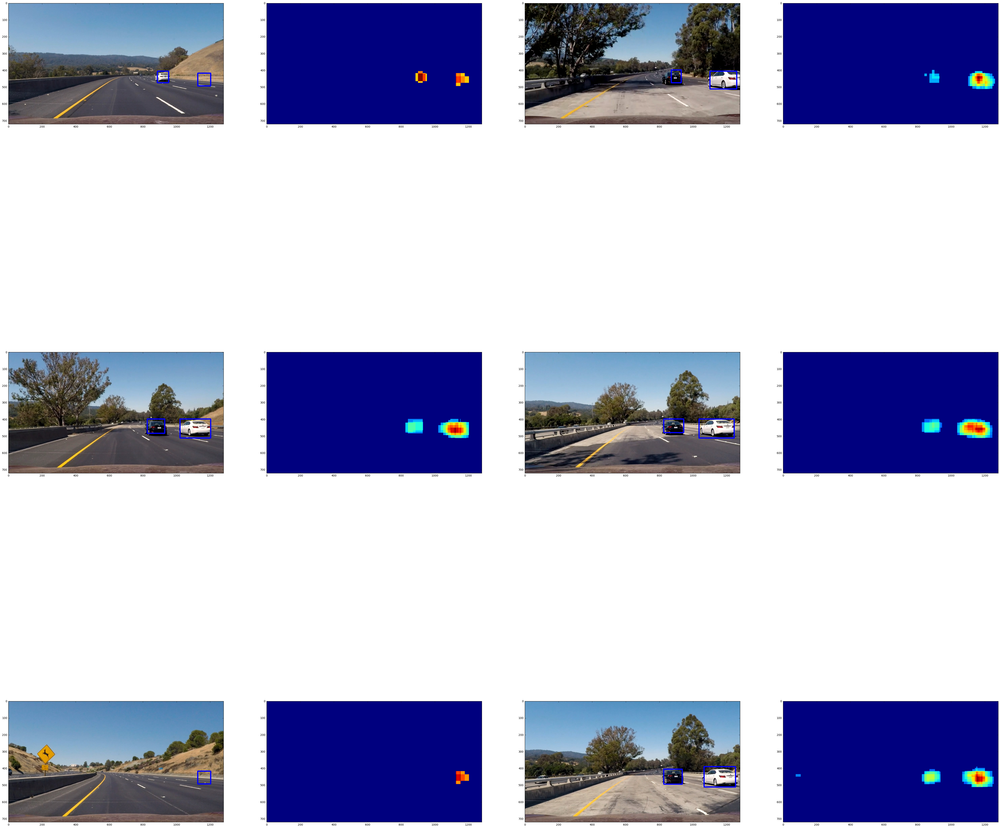

In [12]:
images = read_images("test_images/*")
f, x = plt.subplots(3, 4, figsize=(64, 64))
x = x.ravel()
idx = 0
for i in range(0, len(images)):
    img = images[i]
    img, heat = process_frame(img)
    x[idx].imshow(img)
    x[idx + 1].imshow(heat)
    idx = idx + 2
    

In [ ]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

heatmap = np.zeros_like(image[:,:,0]).astype(np.float)
white_output = 'project_video_short_output.mp4'
clip1 = VideoFileClip("project_video_short.mp4")
white_clip = clip1.fl_image(wrapper_func)
%time white_clip.write_videofile(white_output, audio=False)

HTML("""
<video width="960" height="540" cocntrols>
  <source src="{0}">
</video>
""".format(white_output))

In [ ]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

heatmap = np.zeros_like(image[:,:,0]).astype(np.float)
white_output = 'project_video_output_long.mp4'
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(wrapper_func)
%time white_clip.write_videofile(white_output, audio=False)

HTML("""
<video width="960" height="540" cocntrols>
  <source src="{0}">
</video>
""".format(white_output))